In [251]:
import torch
import wave
import scipy
import librosa
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.signal import butter, filtfilt
import soundfile as sf
from IPython.display import Audio


from TTS.api import TTS

%matplotlib inline
plt.style.use('seaborn-v0_8')
# Get device
# device = "cuda" if torch.cuda.is_available() else "cpu"
device = torch.device('cpu')

In [50]:
TTS().list_models().list_models()

['tts_models/multilingual/multi-dataset/xtts_v2',
 'tts_models/multilingual/multi-dataset/xtts_v1.1',
 'tts_models/multilingual/multi-dataset/your_tts',
 'tts_models/multilingual/multi-dataset/bark',
 'tts_models/bg/cv/vits',
 'tts_models/cs/cv/vits',
 'tts_models/da/cv/vits',
 'tts_models/et/cv/vits',
 'tts_models/ga/cv/vits',
 'tts_models/en/ek1/tacotron2',
 'tts_models/en/ljspeech/tacotron2-DDC',
 'tts_models/en/ljspeech/tacotron2-DDC_ph',
 'tts_models/en/ljspeech/glow-tts',
 'tts_models/en/ljspeech/speedy-speech',
 'tts_models/en/ljspeech/tacotron2-DCA',
 'tts_models/en/ljspeech/vits',
 'tts_models/en/ljspeech/vits--neon',
 'tts_models/en/ljspeech/fast_pitch',
 'tts_models/en/ljspeech/overflow',
 'tts_models/en/ljspeech/neural_hmm',
 'tts_models/en/vctk/vits',
 'tts_models/en/vctk/fast_pitch',
 'tts_models/en/sam/tacotron-DDC',
 'tts_models/en/blizzard2013/capacitron-t2-c50',
 'tts_models/en/blizzard2013/capacitron-t2-c150_v2',
 'tts_models/en/multi-dataset/tortoise-v2',
 'tts_mode

In [51]:
# List available 🐸TTS models
print(TTS().list_models())

# Init TTS
tts = TTS("tts_models/multilingual/multi-dataset/xtts_v2").to(device)
# tts2 = TTS( 'tts_models/en/multi-dataset/tortoise-v2').to(device)
# tts = TTS( 'tts_models/en/ek1/tacotron2')

 > tts_models/multilingual/multi-dataset/xtts_v2 is already downloaded.
 > Using model: xtts


In [54]:
help(tts.tts_to_file)

Help on method tts_to_file in module TTS.api:

tts_to_file(text: str, speaker: str = None, language: str = None, speaker_wav: str = None, emotion: str = None, speed: float = 1.0, pipe_out=None, file_path: str = 'output.wav', split_sentences: bool = True, **kwargs) method of TTS.api.TTS instance
    Convert text to speech.
    
    Args:
        text (str):
            Input text to synthesize.
        speaker (str, optional):
            Speaker name for multi-speaker. You can check whether loaded model is multi-speaker by
            `tts.is_multi_speaker` and list speakers by `tts.speakers`. Defaults to None.
        language (str, optional):
            Language code for multi-lingual models. You can check whether loaded model is multi-lingual
            `tts.is_multi_lingual` and list available languages by `tts.languages`. Defaults to None.
        speaker_wav (str, optional):
            Path to a reference wav file to use for voice cloning with supporting models like YourTTS.
 

In [69]:
# Run TTS
# ❗ Since this model is multi-lingual voice cloning model, we must set the target speaker_wav and language
# Text to speech list of amplitude values as output

# READ THIS TEXT:
# Once upon a time, the King's youngest son became filled with the desire to go abroad, and see the world.

text = 'I once knew an old samurai named Miyamoto Musashi, he was a great warrior and a wise friend.'
text2 = "Dear humanity, we REGRET coming to Earth. We REGRET being alien bastards. AND WE MOST CERTAINLY REGRET THAT THE CORPS JUST BLEW UP OUR RAGGID-Y ASS FLEET!"
text_par = "The airplane, an engineering marvel of the modern era, represents the pinnacle of human ingenuity and innovation in transportation.\
    With its sleek aerodynamic design and powerful propulsion systems, the airplane effortlessly defies gravity, allowing passengers to soar\
    through the skies with unparalleled speed and efficiency. From the moment of takeoff, as the engines roar to life and the aircraft ascends\
    gracefully into the heavens, passengers are treated to breathtaking vistas of the world below, experiencing the thrill of flight firsthand.\
    Inside the cabin, a symphony of technology and comfort awaits, with state-of-the-art avionics guiding the journey and luxurious amenities\
    ensuring a seamless and enjoyable travel experience. As the airplane cruises at cruising altitude, it becomes a temporary sanctuary, where travelers \
    from diverse backgrounds and destinations come together in pursuit of adventure, business, or leisure. With each journey, the airplane not \
    only connects distant destinations but also brings people closer together, transcending borders and fostering a global community united by \
    the shared wonder of flight."
# TTS to variable
# wav = tts.tts(text=text, speaker_wav="rishi2.wav", language="en", emotion='sad')
# Text to speech to a file
# Emotion can be 'neutral', 'happy', 'sad', 'surprise', 'angry'
tts.tts_to_file(text=text_par, speaker_wav="input/tri2.wav",
                language='en', file_path="output/paragraph.wav",
                split_sentences=True,
                emotion='angry')


 > Text splitted to sentences.
['The airplane, an engineering marvel of the modern era, represents the pinnacle of human ingenuity and innovation in transportation.', 'With its sleek aerodynamic design and powerful propulsion systems, the airplane effortlessly defies gravity, allowing passengers to soar    through the skies with unparalleled speed and efficiency.', 'From the moment of takeoff, as the engines roar to life and the aircraft ascends    gracefully into the heavens, passengers are treated to breathtaking vistas of the world below, experiencing the thrill of flight firsthand.', 'Inside the cabin, a symphony of technology and comfort awaits, with state-of-the-art avionics guiding the journey and luxurious amenities    ensuring a seamless and enjoyable travel experience.', 'As the airplane cruises at cruising altitude, it becomes a temporary sanctuary, where travelers     from diverse backgrounds and destinations come together in pursuit of adventure, business, or leisure.', 'W

'output/paragraph.wav'

In [71]:
audio_file_path = 'input/tri.wav'
signal_wave = wave.open(audio_file_path, 'r')
sample_rate = 44100

y, sr = librosa.load(audio_file_path, sr=sample_rate)
# Read the signal wave
sig = np.frombuffer(signal_wave.readframes(len(y)), dtype=np.int16)

In [73]:
def compute_logmel_spectrogram(y, sr, n_mels=128, hop_length=512):
    mel_spectrogram = librosa.feature.melspectrogram(y=y, sr=sr, n_mels=n_mels, hop_length=hop_length)
    logmel_spectrogram = librosa.power_to_db(mel_spectrogram, ref=np.max)
    return logmel_spectrogram

from IPython.display import Audio
Audio(audio_file_path)

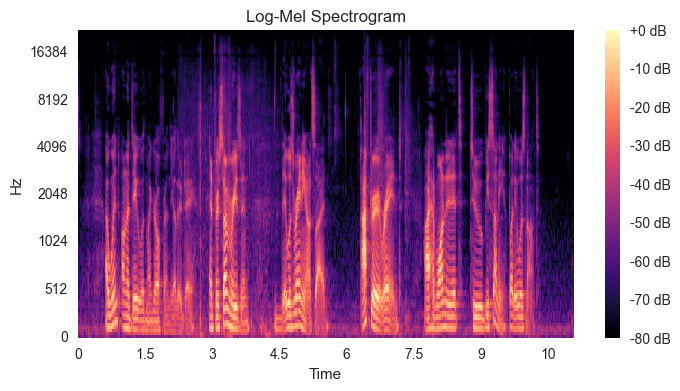

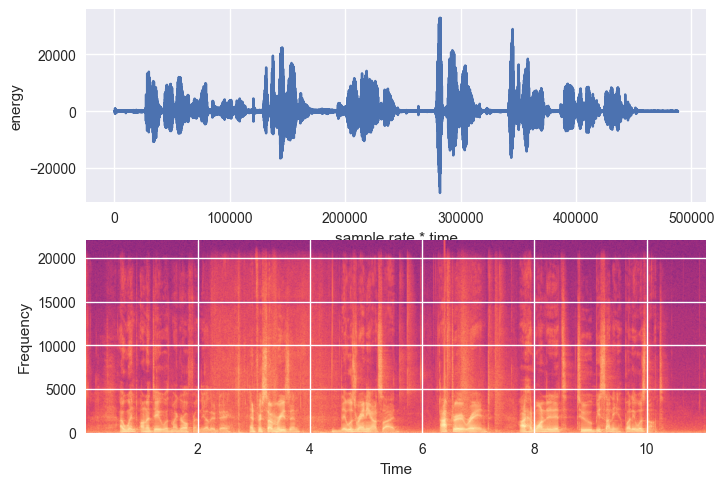

In [143]:
y, sr = librosa.load(audio_file_path, sr=sample_rate)
logmel_spectrogram = compute_logmel_spectrogram(y, sr=sr)

# Display the log-mel spectrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(logmel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Mel Spectrogram')
plt.show()

plot_a = plt.subplot(211)
plot_a.plot(sig)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')

plot_b = plt.subplot(212)
plot_b.specgram(sig, NFFT=1024, Fs=sample_rate, noverlap=900, cmap='magma')
plot_b.set_xlabel('Time')
plot_b.set_ylabel('Frequency')
plt.show()

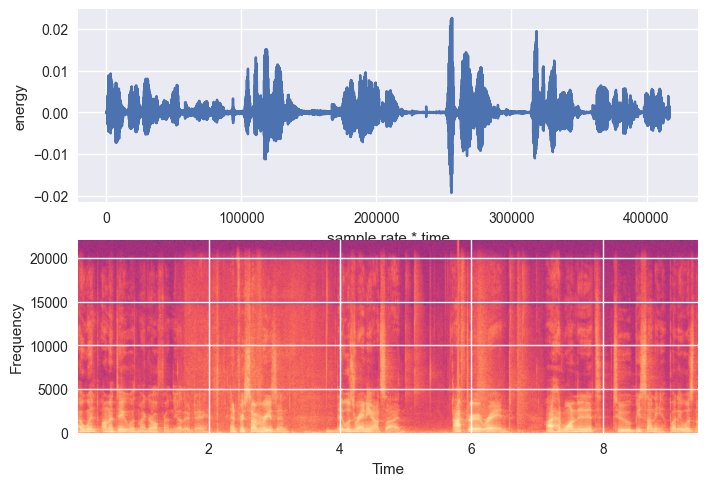

In [144]:
sig2, _ = librosa.effects.trim(sig, top_db=20)
#sig2 = sig2.apply(lambda x: x if abs(x) > 500 else np.sign(x) * 80)
# remove noise
b, a = butter(3, 0.1, btype='low', analog=True)
sig2 = filtfilt(b, a, sig2)

plot_a = plt.subplot(211)
plot_a.plot(sig2)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')

plot_b = plt.subplot(212)
plot_b.specgram(sig2, NFFT=1024, Fs=sample_rate, noverlap=900, cmap='magma')
plot_b.set_xlabel('Time')
plot_b.set_ylabel('Frequency')

plt.show()
Audio(sig2, rate=sample_rate)

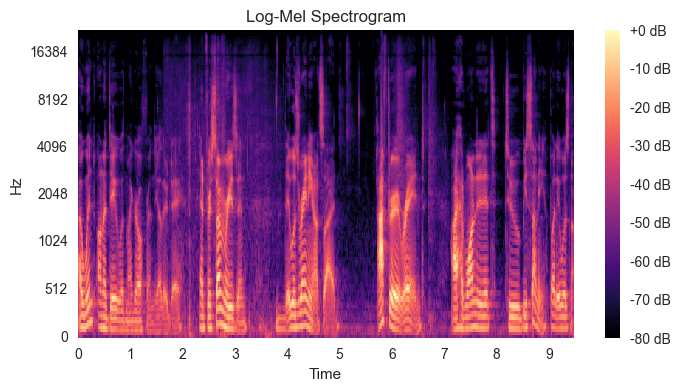

In [145]:
logmel_spectrogram = compute_logmel_spectrogram(sig2.astype('float32'), sr=sr)

# Display the log-mel spectrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(logmel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Mel Spectrogram')
plt.show()

In [146]:
rate = 44100

# Write out audio as WAV
sf.write('input/preprocessed.wav', sig2, rate)

## PostProcessing

/opt/homebrew/anaconda3/envs/voice/lib/python3.11/site-packages/matplotlib/axes/_axes.py:7947: RuntimeWarning: divide by zero encountered in log10
  Z = 10. * np.log10(spec)


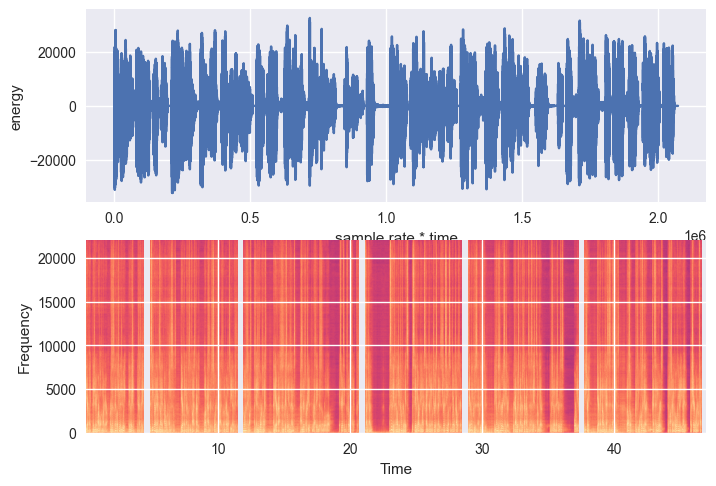

In [161]:
y_out, sr_out = librosa.load('output/paragraph.wav', sr=sample_rate)
logmel_spectrogram = compute_logmel_spectrogram(y_out, sr=sr_out)

signal_wave_out = wave.open('output/paragraph.wav', 'r')
sample_rate = sr_out
sig_out = np.frombuffer(signal_wave_out.readframes(len(y_out)), dtype=np.int16)



# Display the log-mel spectrogram
# plt.figure(figsize=(8, 4))
# librosa.display.specshow(logmel_spectrogram, sr=sr_out, hop_length=512, x_axis='time', y_axis='mel')
# plt.colorbar(format='%+2.0f dB')
# plt.title('Log-Mel Spectrogram')
# plt.show()

plot_a = plt.subplot(211)
plot_a.plot(sig_out)
plot_a.set_xlabel('sample rate * time')
plot_a.set_ylabel('energy')

plot_b = plt.subplot(212)
plot_b.specgram(sig_out, NFFT=1024, Fs=sample_rate, noverlap=900, cmap='magma')
plot_b.set_xlabel('Time')
plot_b.set_ylabel('Frequency')

plt.show()

Audio('output/paragraph.wav')

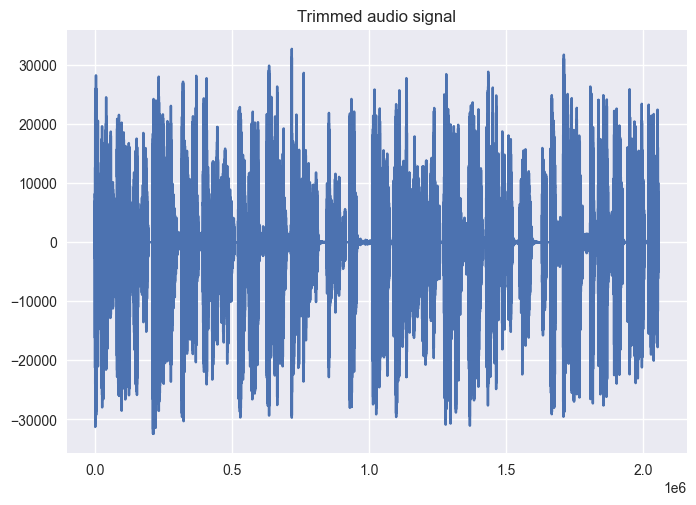

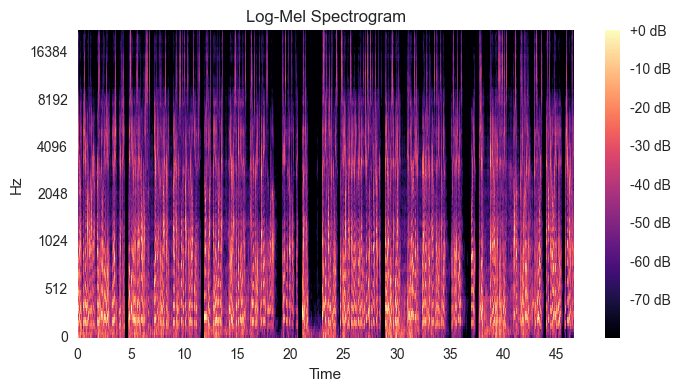

In [253]:
sig_out2, _ = librosa.effects.trim(sig_out, top_db=20)

plt.plot(sig_out2)
plt.title('Trimmed audio signal')
plt.show()

Audio(sig_out2, rate=24000)

logmel_spectrogram = compute_logmel_spectrogram(sig_out2.astype('float32'), sr=sr)
# Display the log-mel spectrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(logmel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Mel Spectrogram')
plt.show()

In [243]:
def remove_spaces(audio, threshold=0.001, frame_rate=24000):
    new_signal = []
    splits = librosa.effects.split(audio, top_db=threshold*max(audio))
    for i, (start, end) in enumerate(splits):
        # If it's not the last split, let's modify the vocal pause
        if i < len(splits) - 1:
            # Find the gaps between each split
            vocal_pause = splits[i+1][0] - end
            # Insert a gap between each split, standard speech gap is 0.08s or 80ms
            standard_gap = int(frame_rate * np.random.normal(0.08, 0.01))
            # If the vocal pause is longer than the standard gap, increase the gap slightly
            if vocal_pause >= standard_gap:
                standard_gap += int(np.log2(vocal_pause)) * 100
            # Create the new signal
            new_signal.append(np.concatenate(
                    [audio[start:end], np.zeros(standard_gap)]
                )
            )
        # If it's the last split, just append the audio
        else:
            new_signal.append(audio[start:end])
    # Concatenate the new signal
    return np.concatenate(new_signal)
    
new_sig = remove_spaces(sig_out2)
Audio(new_sig, rate=24000)

In [246]:
# scipy.io.wavfile.write('output/paragraph_clean.wav', 24000, new_sig.astype(np.int16))

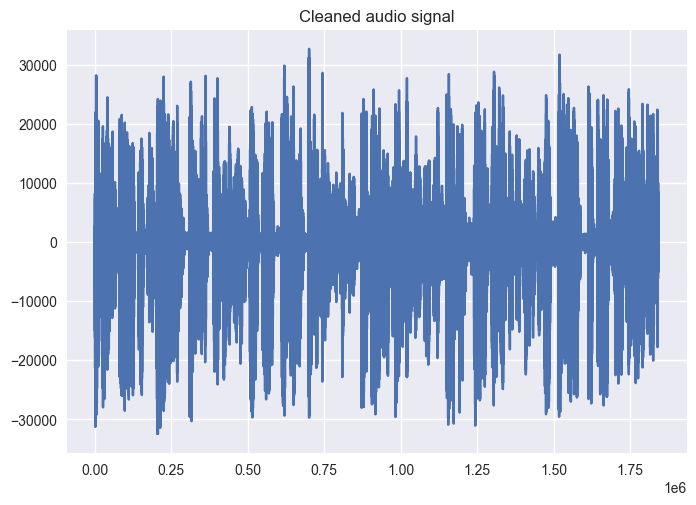

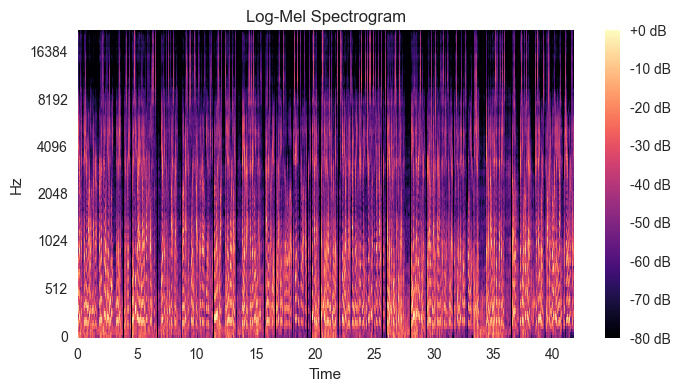

In [255]:
plt.plot(new_sig)
plt.title('Cleaned audio signal')
plt.show()

logmel_spectrogram = compute_logmel_spectrogram(new_sig.astype('float32'), sr=sr)

# Display the log-mel spectrogram
plt.figure(figsize=(8, 4))
librosa.display.specshow(logmel_spectrogram, sr=sr, hop_length=512, x_axis='time', y_axis='mel')
plt.colorbar(format='%+2.0f dB')
plt.title('Log-Mel Spectrogram')
plt.show()
